# Convolution

Convolution is a useful mathematical tool operating on two functions. There are many applications in signal processing, probability & statistics, image processing, computer vision, and more that utilize the convolution.  

Formally, a convolution between any two functions $f$ and $g$ is defined as the following operation:  

$$(f*g)(t) = \int_{-\infty}^{\infty} f(\tau)g(t - \tau)d\tau$$

#### Important Properties
\begin{align}
    &\text{Commutativity: }\quad\quad\quad\quad\quad f*g = g*f \\
    &\text{Associativity: }\quad\quad\quad\quad\quad\;\;\ f*(g*h) = (f*g)*h \\
    &\text{Linearity: }\quad\quad\quad\quad\quad\quad\quad f*(\alpha g + \beta h) = \alpha(f*g) + \beta(f* h) \\
    &\text{Multiplicative Identity: }\quad\quad\; f * \delta = f \\
    &\text{Translation Equivariance: }\quad\ T(f*g) = (Tf)*g = f*(Tg)
\end{align}

#### Convolution vs. Cross-Correlation

A similar operation to convolution is called [cross correlation](https://en.wikipedia.org/wiki/Cross-correlation) which can be thought of as a measure of similiarity between two signals (this will become more apparent when we discuss 2D convolution). The definition of the cross correlation operation is defined as the following:

$$(f \star g)(t) = \int_{-\infty}^{\infty} f(\tau)g(\tau - t)d\tau$$

The *only* difference between the two operations is that the signal $g$ is reversed before computation in convolution (this can be seen directly from the definition).

# Discrete Convolution

This notebook will focus on the convolution of signals indexed in discrete space or time, because these are the signals that we can actually measure and work with on a computer - even when the physical signal lives in a continuous domain (e.g. sensor measurements of the local air pressure).

In [1]:
# import libraries
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from IPython import display
from filters import *
from visualization import visualize_conv1d_gif, visualize_conv2d

# 1D Convolution

The convolution of two 1D signals $f$ and $g$ is defined as:

\begin{align*}
    (f*g)[n] = \sum_{k=-\infty}^\infty f[k]g[n-k]
\end{align*}

For physical signals, the bounds on the summation are not actually $-\infty$ to $\infty$, plus an infinite summation is not computationally tractable. The sum is really defined over where the signals themselves are defined.

Intuitively, the convolution can be seen as sliding one signal against another and computing the dot product everywhere the two signals intersect. 

From the equation above, the size of $n$ is actually a choice made by the user since we can compute the convolution anywhere (even $n = \infty$) by *padding* the signals for points outside of the original domain with zeros or any arbitrary padding value.

For now, let $n$ be the number of samples you get by convolving the two inputs signals starting with the first element of $f$ lined up with the last element of $g$, and ending with the last element of $f$ lining up with the first element of $g$.

#### Intuition
An interesting question to ask is what is convolution *actually* doing? From a signals processing perspective, convolution is the response of a [linear time-invariant](https://brilliant.org/wiki/linear-time-invariant-systems/) (LTI) system to a signal. In this context, convolution is usually written as:

\begin{align*}
    (x*h)[n] = \sum_{k=-\infty}^\infty x[k]h[n-k]
\end{align*}

Where $x$ is a signal and $h$ is called the *impulse response function* which describes how an LTI system responds to a unit impulse (think about an impulse as a sudden 'kick' to a system).

<img width="200" src="https://cnx.org/resources/37ae31f3b7a37ab502ab933968993acddc18f7c4/impulse.PNG">
<p style="text-align: center;">Figure 1: Unit impulse response</p>

The symbol $\delta$ is the Dirac delta function which is defined as:

\begin{align*}
    \delta(x) = 
    \begin{cases} 
      0 \;\;\quad\text{x $\ne$ 0} \\
      \infty \;\quad\text{x = 0} 
    \end{cases}
\end{align*}

An important fundamental property of the Dirac delta is the *sifting property* which states:

\begin{align*}
    \int_{-\infty}^{\infty} f(x)\delta(x - a)dx = f(a)
\end{align*}

That is, the Dirac delta 'picks' or 'sifts' the value of the function at only $a$ when you integrate over it. This also applies in the discrete case with a summation.

<img width="200" src="https://sciencenotes.org/wp-content/uploads/2014/07/friction3.png">
<p style="text-align: center;">Figure 2: Block on a surface with friction</p>

To build intuition, consider the following example: Suppose you want to model the dynamics of a block sliding along an abrasive surface (Figure 2). We can represent the unit impulse response as the velocity resulting from a sudden push on the block which will eventually decay to zero due to the friction from the surface. The signal $x$ can represent the force we apply to the block over time. Using the sifting property of the Dirac delta and the definition of 1D  discrete convolution, notice that we can write the signal $x$ at time $t$ as follows:

\begin{align*}
    x[t] = \sum_\tau x[\tau] \delta[\tau - t]
\end{align*}

The dynamics (the velocity) is encoded in some response operator we'll call $H$ which will tell us how the system responds to a signal. We already know that the system should respond to the unit impulse signal $\delta$ with $h$. Let's use this to see how the system responds to the force signal at time $t$:

\begin{align*}
    H\{x[t]\} &= H\{\sum_\tau x[\tau] \delta[\tau - t]\} \\
            &= \sum_\tau x[\tau] H\{\delta[\tau - t]\} \\
            &= \sum_\tau x[\tau] h[\tau - t] \\
            &= (x * h)[t]
\end{align*}

An interesting observation of this example is that when multiply $x$ with $h$ and the timestep $dt = 1$ (which is not explicitly written), the units come out as joules. In this case, this means that the convolution of the driving force $x$ and the velocity response $h$ gives us the energy of the system over time!

In [2]:
def convolution_1d(f, g):
    """Computes a 1D discrete convolution over two signals f and g
    
    Args:
        f (np.array): one of the signals
        g (np.array): the other signal
    """
    # compute padding
    padding = len(g) - 1
    
    # compute output shape
    length = len(f) - len(g) + 2 * padding + 1
    
    # pad input signals
    f_pad, g_pad = np.zeros((2, length))
    f_pad[:len(f)] = f
    g_pad[length - len(g):] = g[::-1]
    
    output = np.zeros(length)
    
    # iterate through each timestep
    for i in range(length):
        
        # perform dot product
        output[i] = f_pad[:i + 1] @ g_pad[-(i + 1):]
    
    return output    

## Example 1: Sliding block impulse response
Now lets visualize the response of the system described in the **intuition** section above. We'll model the unit impulse response as an exponential decay, and the force as a periodic push

In [15]:
def impulse_response(n, end_time=1, scale=1):
    """Returns an exponential decay unit impulse response signal
    
    Args:
        n (int): number of samples
        end_time (float): time duration of response
        scale (float): decay rate
    """
    x = np.linspace(0, end_time, n)
    return np.exp(-scale * x)

def force(cycles, amplitude=1, period=1):
    """Returns a driving force signal as a sawtooth wave
    
    Args:
        cycles (int): number of full periods in the signal
        amplitude (float): height of signal
        period (float): period of signal in seconds
    """
    tooth = np.arange(0, amplitude, amplitude / period)
    return np.tile(tooth, cycles)

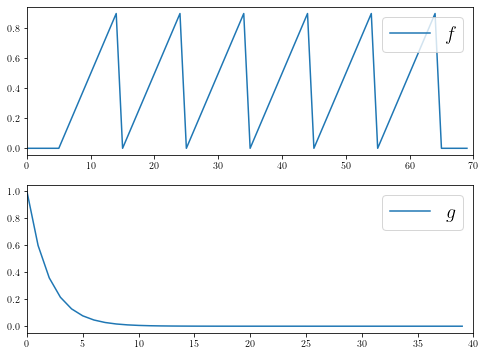

In [16]:
# create the signal for the force
x = force(cycles=6, amplitude=1, period=10)

# create the impulse response signal
h = impulse_response(40, scale=20) 

# for visualization purposes, pad the signal with extra zeros
x_padded = np.pad(x, 5)

# plot them both
fig, axes = plt.subplots(2, 1, figsize=(8,6))
_ = axes[0].plot(x_padded, label="$f$")
_ = axes[1].plot(h, label="$g$")
_ = axes[0].set_xlim(0, len(x_padded))
_ = axes[1].set_xlim(0, len(h))
_ = axes[0].legend(fontsize=20, loc='upper right')
_ = axes[1].legend(fontsize=20, loc='upper right')

In [5]:
# convolve and save gif
response = convolution_1d(x_padded, h)
visualize_conv1d_gif(x_padded, h, response, filepath="figures/sliding_block.gif")

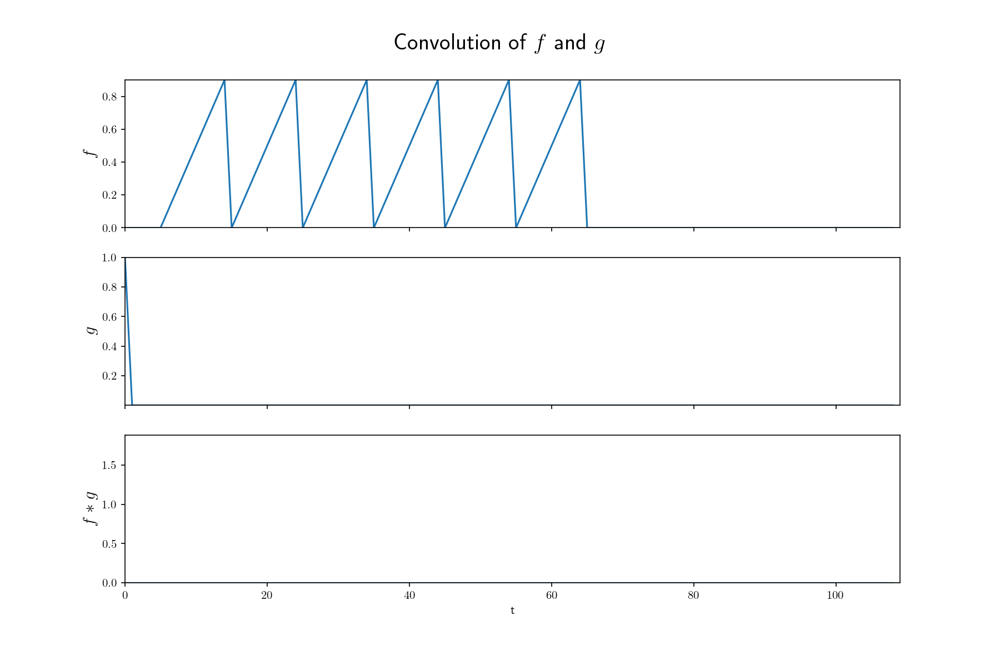

In [6]:
# display gif in notebook
with open('figures/sliding_block.gif', 'rb') as f:
    gif_data = f.read()
display.Image(data=gif_data, format='png')

## Example 2: Convolution with a Gaussian

Now lets consider the case where $f, g$ are univariate signals with $g$ begin a gaussian, and $f$ is any random signal. 

In [18]:
def gaussian_signal(n, dmin=-1, dmax=1, mean=0, std=1):
    """Returns a Gaussian signal 
    
    Args:
        n (int): number of samples
        dmin (float): minimum of the signal domain
        dmax (float): maximum of the signal domain
        mean (float): mean of the gaussian
        std (float): standard deviation of the gaussian
    """
    x = np.linspace(dmin, dmax, n)
    return np.exp(-0.5 * ((x - mean) / std)**2) / np.sqrt(2 * np.pi * std**2)

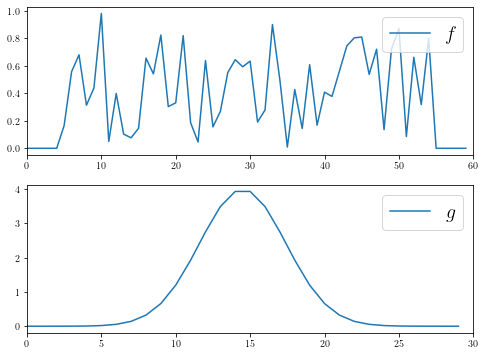

In [19]:
# create a random signal for f
f = np.random.rand(50)

# create a gaussian signal for g
g = gaussian_signal(30, dmin=-0.5, dmax=0.5, std=0.1)

# for visualization purposes, pad the signal with extra zeros
f_padded = np.pad(f, 5)

# plot them both
fig, axes = plt.subplots(2, 1, figsize=(8,6))
_ = axes[0].plot(f_padded, label="$f$")
_ = axes[1].plot(g, label="$g$")
_ = axes[0].set_xlim(0, len(f_padded))
_ = axes[1].set_xlim(0, len(g))
_ = axes[0].legend(fontsize=20, loc='upper right')
_ = axes[1].legend(fontsize=20, loc='upper right')

In [20]:
# convolve and save gif
response = convolution_1d(f_padded, g)
visualize_conv1d_gif(f_padded, g, response, filepath="figures/conv1d.gif")

NameError: name 'convolution_1d' is not defined

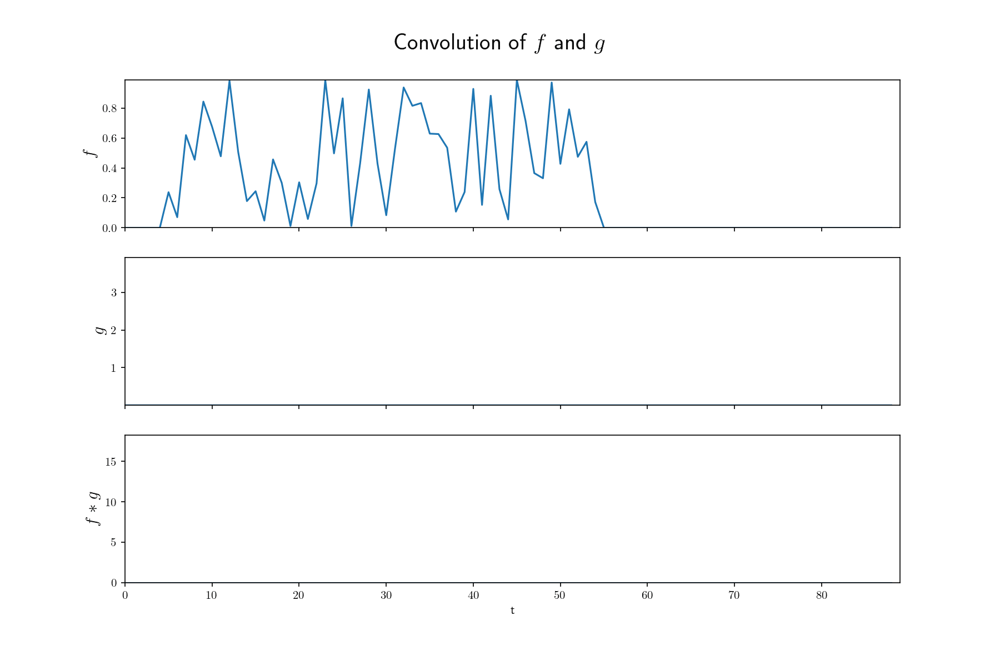

In [21]:
# display gif in notebook
with open('figures/conv1d.gif', 'rb') as f:
    gif_data = f.read()
display.Image(data=gif_data, format='png')

# 2D Convolution

The convolution of two 2D signals $f$ and $g$ is defined as:

\begin{align*}
    (f*g)[i, j] = \sum_{k=-\infty}^\infty\sum_{l=-\infty}^\infty f[k, l]g[i-k, j-l]
\end{align*}

Clearly, it is very similar to the definition of a 1D discrete convolution, with the addition of another dimension to sum over.

#### Important Parameters
Now is a good time to define a few terms that we didn't cover in the 1D case:
- Stride : The number of steps the kernel advances in a direction (in the 1D case, the stride was implicitly set as 1)
- Padding : The 'filler' values surrounding the boundary of a signal
- Kernel Size: The dimensions of the kernel or filter (in the 1D case, this was just the length of $g$)

#### Remarks on Padding

In the 1D case, we padded our signals on the left and right so that they were the same length, and so the convolution was effectively sliding one signal rightward over the other until they lined up. In general, you can pad your signals anyway you want, and it is common to pad evenly around the signals especially in the image processing context. There are three common padding modes:

Full - One signal is padded so that every possible intersection of the signal against the other is possible (this is what we did in the 1D case)

Valid - The convolution is only computed where one signal fully intersects with the other

Same - One signal is padded so that the output dimensions is the same as the signal with the largest dimensions (e.g. the output is the same size as the image)

| Full Padding | Valid Padding | Same Padding |
|:-:|:-:|:-:|
|<img width="195" src="http://deeplearning.net/software/theano_versions/dev/_images/full_padding_no_strides.gif"> | <img width="200" src="http://deeplearning.net/software/theano_versions/dev/_images/full_padding_no_strides_transposed.gif">|<img width="200" src="https://miro.medium.com/max/790/1*1okwhewf5KCtIPaFib4XaA.gif">|

The visualizations above were taken from this [in-depth guide](http://deeplearning.net/software/theano_versions/dev/tutorial/conv_arithmetic.html#) that explains everything you need to know about 2D discrete convolutions.


#### Output Shape Formula

Now how are you supposed to know how much to pad for the full or same padding mode? In the `convolution_1d` function above, how did we know how to compute the `length` of the output signal? It turns out there is a very handy formula for computing the output shape of a convolution given by:

$$\text{output size} = \left\lfloor \frac{\text{input size} + 2\times\text{padding} - \text{kernel size}}{\text{stride}} \right\rfloor + 1$$

The nice thing about this formula is that it applies to each dimension of a signal *independently*. For example, if you want to know how to pad an image so that the output size of a convolution between the image and an edge detecting filter is the same as the image's dimensions, then for the height and width dimensions, set $\text{input}=\text{output}$ and solve for $\text{padding}$. This formula even applies to N-dimensional convolutions on N-dimensional signals.

In [2]:
def conv_output_shape(i, p, k, s):
    """Computes the output shape of a convolution between
       signals along a single dimension
    
    Args:
        i (int): input shape
        p (int): amount of padding 
        k (int): kernel size
        s (int): stride
    """
    return (i + 2 * p - k) // s + 1

def convolution_2d(f, g, stride=1, mode='same'):
    """Computes a 2D discrete convolution over two signals f and g
    
    Args:
        f (np.ndarray): one of the signals
        g (np.ndarray): the other signal
        stride (int or 2-tuple[int]): filter steps in each direction
        mode (string): type of padding to use
    """
    # input shape
    in_shape = f.shape
    
    # stride in each direction
    if isinstance(stride, tuple):
        assert len(stride) == 2, "Stride must be either an integer or 2-tuple"
    s = (stride, stride) if isinstance(stride, int) else stride
    
    # flip kernel, otherwise this would be cross-correlation
    g_flipped = np.fliplr(np.flipud(g))
    ks = g.shape
    
    # padding the input and compute the output shape
    assert mode in ["full", "same", "valid"], "Padding mode must be one of ['full', 'same', 'valid']"
    if mode == "full":
        height_pad = ks[0] - 1
        width_pad = ks[1] - 1
        f_padded = np.pad(f, ((height_pad,), (width_pad,)))
    elif mode == "valid":  ## do nothing
        height_pad = 0
        width_pad = 0
        f_padded = f
    elif mode == "same":  ## padding computed via output shape formula
        height_pad = (s[0] * (in_shape[0] - 1) - in_shape[0] + ks[0]) // 2
        width_pad = (s[1] * (in_shape[1] - 1) - in_shape[1] + ks[1]) // 2
        
        f_padded = np.pad(f, ((height_pad,), (width_pad,)))
        
    # output shape
    output_shape = (
        conv_output_shape(in_shape[0], height_pad, ks[0], s[0]), 
        conv_output_shape(in_shape[1], width_pad, ks[1], s[1])
    )
    
    # initialize response
    response = np.zeros(output_shape)
        
    # perform the convolution
    for i in range(0, f_padded.shape[0] - ks[0] + 1, stride):
        for j in range(0, f_padded.shape[1] - ks[1] + 1, stride):
            
            # get window of f that g 'looks' at
            window = f_padded[i: i + ks[0], j: j + ks[1]]
            ws = window.shape
            
            # handle kernel stepping out of bounds
            kernel = g_flipped[:ws[0], :ws[1]] if ks != window.shape else g_flipped
            
            response[i, j] = np.sum(window * kernel)

    return response
    

## Example 3: Image Filtering

A great way to visualize 2D convolutions is with examples of image filtering. You may be familiar with notion of an image filter from using a photo editing software such as Photoshop which can produce different effects on an image. In this example we'll cover sharpening, blurring, and gradient filters.

In [3]:
# define some filters!

# identity
delta = UnitImpulse(size=3)

# blurring
boxblur = BoxBlur(size=3)
gaussblur = GaussianBlur(size=5)

# edge detectors
prewitt_vert = Prewitt("vert")
prewitt_horiz = Prewitt("horiz")
prewitt_ldiag = Prewitt("ldiag")
prewitt_rdiag = Prewitt("rdiag")

sobel_vert = Sobel("vert")
sobel_horiz = Sobel("horiz")
sobel_ldiag = Sobel("ldiag")
sobel_rdiag = Sobel("rdiag")

# high pass filters
highpass = HighPass()
laplace = Laplacian()

Next, let's load in an image to play with and convert it grayscale.

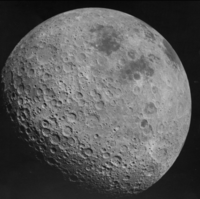

In [4]:
moon = Image.open("images/moon.png").convert("L")
moon_img = np.array(moon).astype(float) / 255.
display.Image("images/moon.png")

#### Sanity check
Let's verify the convolution multiplicative identity property with our unit impulse filter by checking that the convolution gives us the same image.

In [5]:
print(delta)

[0. 0. 0.]
[0. 1. 0.]
[0. 0. 0.]


Images are identical!


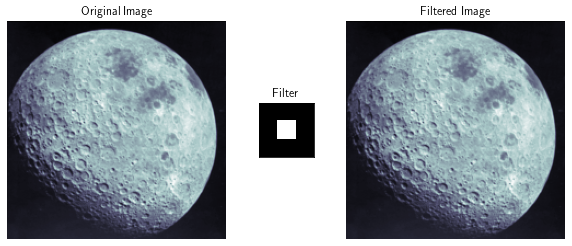

In [6]:
img_identity = convolution_2d(moon_img, delta())

# verify images are the same
if np.array_equal(moon_img, img_identity): print("Images are identical!")
    
visualize_conv2d(moon_img, delta(), img_identity)

#### Image sharpening

Now let's look at an example of image sharpening. This application demonstrates the utility of the linearity property of convolution. Suppose we had a low resolution image that we want to sharpen. A reasonable way to approach sharpening an image would be to enhance the fine details which are the features that change rapidly over the pixel space. In signals processing lingo, we want to apply a high pass filter.

In [7]:
print(highpass)

[-1 -1 -1]
[-1  8 -1]
[-1 -1 -1]


You might notice that if this filter passes over a region of pixels that are all the same value, the output is 0. And if it passes over a region where the pixels are *approximately* the same, you might get an output *close* to 0. Conversly, if it passes over a high frequency region in the image, then the output might be nonzero. Effectively, this filter ignores low frequency features and picks out the high frequency features. So how can we use this to sharpen an image?

Let's try extracting the high frequency features and adding a scalar multiple of them to the original image.
Define $I$ to be the image, $I_s$ to be the sharpened image, $f_H$ to be the high pass filter, and $\alpha \in \mathbb{R}^+$:
\begin{align*}
    I_s &= I + \alpha \cdot I * f_H \\
        &= I * \delta + \alpha \cdot I * f_H \\
        &= I * (\delta + \alpha \cdot f_H)
\end{align*}

Thus we can create a sharpening filter just by adding a high pass filter to the unit impulse kernel! To emphasize the sharpening effect, let's first blur the image.

In [8]:
# first intentionally blur the image to emphasize sharpening effect
blurred_moon = convolution_2d(moon_img, boxblur())

# extract high frequency features
high_pass_feats = convolution_2d(blurred_moon, highpass())

# directly create the sharpening filter
alpha = 1 / 4
sharpen = delta() + alpha * highpass()

print(sharpen)

[[-0.25 -0.25 -0.25]
 [-0.25  3.   -0.25]
 [-0.25 -0.25 -0.25]]


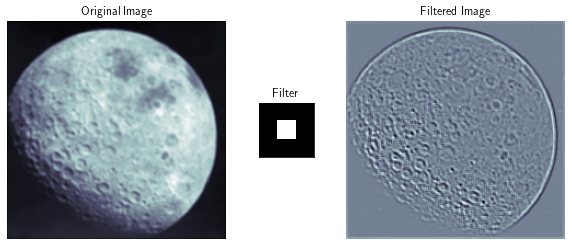

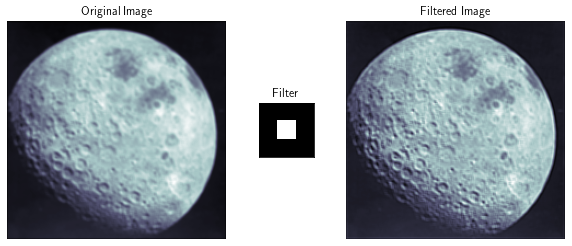

In [9]:
# sharpen the image
sharpened_moon = convolution_2d(blurred_moon, sharpen)

visualize_conv2d(blurred_moon, highpass(), high_pass_feats)
visualize_conv2d(blurred_moon, sharpen, sharpened_moon)

#### Gradient Kernels

At this point, we know that grayscale images can be represented as 2D functions with the z-axis as the luminosity or brightness value of an individual pixel. Can we take the gradient of this function? Recall the definition of partial derivatives of 2D functions:

\begin{align*}
    \frac{\partial f(x,y)}{\partial x} &= \lim_{\epsilon\to 0} \frac{f(x + \epsilon, y) - f(x, y)}{\epsilon} \\
    \frac{\partial f(x,y)}{\partial y} &= \lim_{\epsilon\to 0} \frac{f(x, y + \epsilon) - f(x, y)}{\epsilon}
\end{align*}

But images are not nice continuous functions! So we have to resort to an approximation of the partials, and instead of computing the difference of the image by an amount $\epsilon$ in one direction, we use a centered difference which is more convenient:

\begin{align*}
    \frac{\partial }{\partial x}I[x,y] &\approx \frac{I[x + 1, y] - I[x - 1, y]}{2}\\
    \frac{\partial }{\partial y}I[x,y] &\approx \frac{I[x, y + 1] - I[x, y - 1]}{2}
\end{align*}

Ignoring the factor of $\frac{1}{2}$, we can rewrite the $x$-derivative as:

$$\frac{\partial }{\partial x}I[x,y] \approx I[x + 1, y]+ 0\cdot I[x, y] - I[x - 1, y]$$

Which leads us to define the following 1D derivative filters:

\begin{align*}
    D_x &= \begin{bmatrix} 1 & 0 & -1 \end{bmatrix} \\
    D_y &= \begin{bmatrix} 1 \\ 0 \\ -1 \end{bmatrix} 
\end{align*}

To get 2D *gradient* filters, we can build upon our 1D derivative filters, which is exactly some very smart people did back in the 1960's and 1970's:

$\underline{\text{Prewitt filter}}$

\begin{align*}
    P_x &= 
    \begin{bmatrix}\phantom{-}1 \\ \phantom{-}1 \\ \phantom{-}1\end{bmatrix}
    \begin{array}{@{}c@{}}
    \begin{bmatrix}1&0&-1\end{bmatrix}\\
    \mathstrut\\
    \mathstrut
    \end{array}
    = \begin{bmatrix} \phantom{-}1 & \phantom{-}0 & -1 \\ \phantom{-}1 & \phantom{-}0 & -1 \\ \phantom{-}1 & \phantom{-}0 & -1\end{bmatrix} \\
    P_y &= 
    \begin{bmatrix}\phantom{-}1 \\ \phantom{-}0 \\ -1\end{bmatrix}
    \begin{array}{@{}c@{}}
    \begin{bmatrix}1&1&\phantom{-}1\end{bmatrix}\\
    \mathstrut\\
    \mathstrut
    \end{array}
    = \begin{bmatrix} \phantom{-}1 & \phantom{-}1 & \phantom{-}1 \\ \phantom{-}0 & \phantom{-}0 & \phantom{-}0 \\ -1 & -1 & -1\end{bmatrix}
\end{align*}

$\underline{\text{Sobel filter}}$

\begin{align*}
    S_x &= 
    \begin{bmatrix}\phantom{-}1 \\ \phantom{-}2 \\ \phantom{-}1\end{bmatrix}
    \begin{array}{@{}c@{}}
    \begin{bmatrix}1&0&-1\end{bmatrix}\\
    \mathstrut\\
    \mathstrut
    \end{array}
    = \begin{bmatrix} \phantom{-}1 & \phantom{-}0 & -1 \\ \phantom{-}2 & \phantom{-}0 & -2 \\ \phantom{-}1 & \phantom{-}0 & -1\end{bmatrix} \\
    S_y &= 
    \begin{bmatrix}\phantom{-}1 \\ \phantom{-}0 \\ -1\end{bmatrix}
    \begin{array}{@{}c@{}}
    \begin{bmatrix}1&2&\phantom{-}1\end{bmatrix}\\
    \mathstrut\\
    \mathstrut
    \end{array}
    = \begin{bmatrix} \phantom{-}1 & \phantom{-}2 & \phantom{-}1 \\ \phantom{-}0 & \phantom{-}0 & \phantom{-}0 \\ -1 & -2 & -1\end{bmatrix}
\end{align*}

Filters that can be written in this vector-vector form (called [outer products](https://en.wikipedia.org/wiki/Outer_product)) are called [separable filters](https://en.wikipedia.org/wiki/Separable_filter) which reduce the computational complexity of convolution using the associativity property. Additionally, these filters are used in common edge detection algorithms such as [canny edge detection](https://en.wikipedia.org/wiki/Canny_edge_detector). 

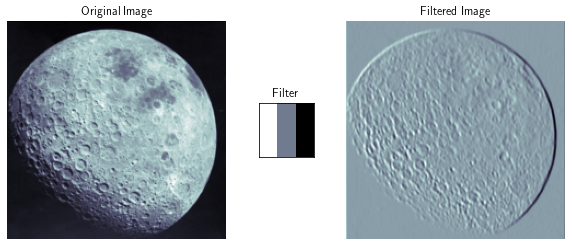

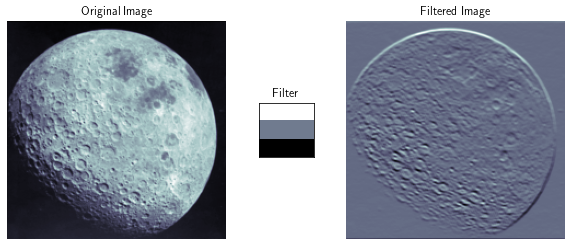

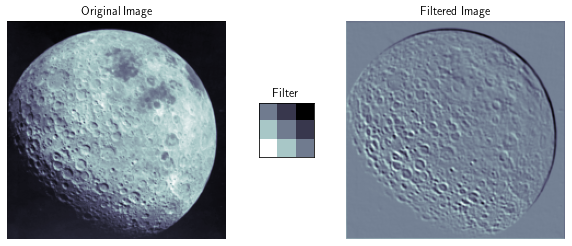

In [10]:
# prewitt gradient
horiz_edged = convolution_2d(moon_img, prewitt_horiz())
vert_edged = convolution_2d(moon_img, prewitt_vert())
rdiag_edged = convolution_2d(moon_img, prewitt_rdiag())
visualize_conv2d(moon_img, prewitt_horiz(), horiz_edged)
visualize_conv2d(moon_img, prewitt_vert(), vert_edged)
visualize_conv2d(moon_img, prewitt_rdiag(), rdiag_edged)

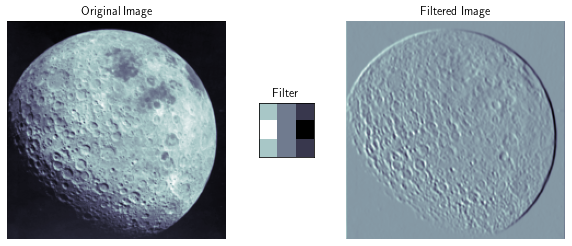

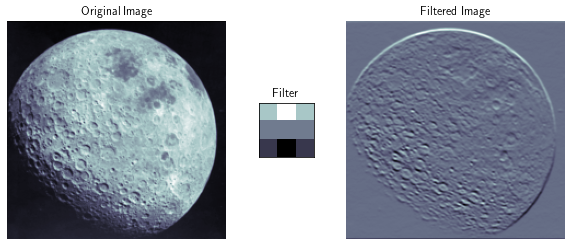

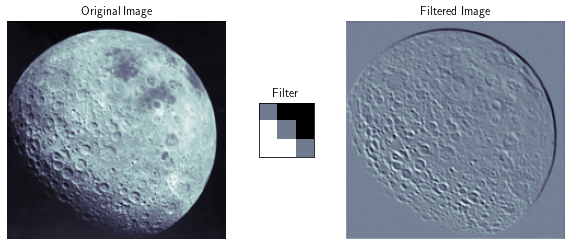

In [11]:
# sobel gradient
sobel_xed = convolution_2d(moon_img, sobel_horiz())
sobel_yed = convolution_2d(moon_img, sobel_vert())
sobel_diaged = convolution_2d(moon_img, sobel_rdiag())

visualize_conv2d(moon_img, sobel_horiz(), sobel_xed)
visualize_conv2d(moon_img, sobel_vert(), sobel_yed)
visualize_conv2d(moon_img, sobel_rdiag(), sobel_diaged)

#### Blurring (Low pass filtering)

We some intuition about high pass filters from the image sharpening example, but what about extracting low frequency information from an image? This can be achieved with a low pass filter which, when applied to an image, produces a blurring effect. Why? Because the low pass filter 'washes' out high frequency features such as texture and edges, and keeps low frequency features such as blobs, and regions that don't vary a lot in general. One way to achieve this effect is with local averaging kernels that take the average or some kind of weighted average over an image patch.

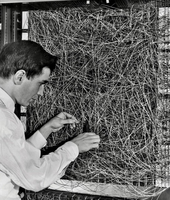

In [12]:
mark1 = Image.open("images/mark1.png").convert("L")
mark1_img = np.array(mark1).astype(float) / 255.
display.Image("images/mark1.png")

In [29]:
print("Geometric Average (Box blur kernel):")
print(boxblur)

print("\nGaussian Weighted Average (Gaussian blur kernel):")
print(gaussblur)

Geometric Average (Box blur kernel):
[0.11111111 0.11111111 0.11111111]
[0.11111111 0.11111111 0.11111111]
[0.11111111 0.11111111 0.11111111]

Gaussian Weighted Average (Gaussian blur kernel):
[0.05854983 0.0851895  0.09653235 0.0851895  0.05854983]
[0.0851895  0.12394999 0.14045374 0.12394999 0.0851895 ]
[0.09653235 0.14045374 0.15915494 0.14045374 0.09653235]
[0.0851895  0.12394999 0.14045374 0.12394999 0.0851895 ]
[0.05854983 0.0851895  0.09653235 0.0851895  0.05854983]


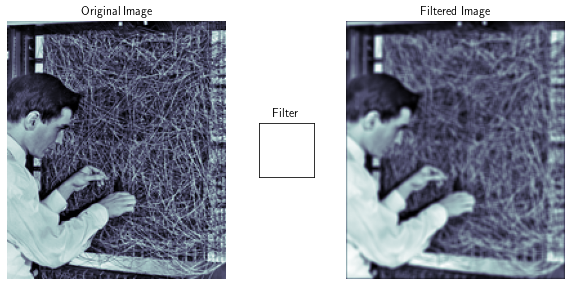

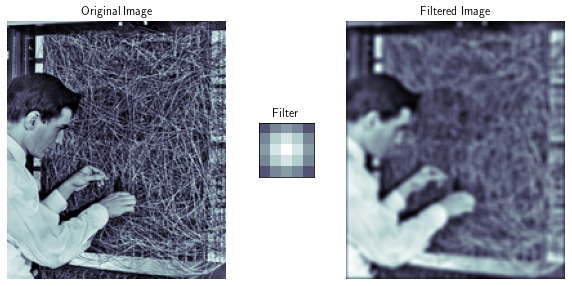

In [31]:
box_blurred = convolution_2d(mark1_img, boxblur())
gaussian_blurred = convolution_2d(mark1_img, gaussblur())
visualize_conv2d(mark1_img, boxblur(), box_blurred)
visualize_conv2d(mark1_img, gaussblur(), gaussian_blurred)